# "구단주님, 당장 이 선수를 들이셔야 합니다."
## *- FIFA 19 가성비 선수 찾기 -*
#### <div style="text-align: right">데잇걸즈 3기 김성보, 손지현, 이보람, 전재민, 정보경</div>
---

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

pd.set_option('display.max_columns', None)
pd.set_option('float_format', '{:f}'.format) 

In [2]:
fifa_raw = pd.read_csv('fifa.csv', index_col=0)
fifa_raw.head()

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,€110.5M,€565K,2202,Left,5.000000,4.000000,4.000000,Medium/ Medium,Messi,Yes,RF,10.000000,"Jul 1, 2004",NaN,2021,5'7,159lbs,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2,84.000000,95.000000,70.000000,90.000000,86.000000,97.000000,93.000000,94.000000,87.000000,96.000000,91.000000,86.000000,91.000000,95.000000,95.000000,85.000000,68.000000,72.000000,59.000000,94.000000,48.000000,22.000000,94.000000,94.000000,75.000000,96.000000,33.000000,28.000000,26.000000,6.000000,11.000000,15.000000,14.000000,8.000000,€226.5M
1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,€77M,€405K,2228,Right,5.000000,4.000000,5.000000,High/ Low,C. Ronaldo,Yes,ST,7.000000,"Jul 10, 2018",NaN,2022,6'2,183lbs,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,84.000000,94.000000,89.000000,81.000000,87.000000,88.000000,81.000000,76.000000,77.000000,94.000000,89.000000,91.000000,87.000000,96.000000,70.000000,95.000000,95.000000,88.000000,79.000000,93.000000,63.000000,29.000000,95.000000,82.000000,85.000000,95.000000,28.000000,31.000000,23.000000,7.000000,11.000000,15.000000,14.000000,11.000000,€127.1M
2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,€118.5M,€290K,2143,Right,5.000000,5.000000,5.000000,High/ Medium,Neymar,Yes,LW,10.000000,"Aug 3, 2017",NaN,2022,5'9,150lbs,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3,79.000000,87.000000,62.000000,84.000000,84.000000,96.000000,88.000000,87.000000,78.000000,95.000000,94.000000,90.000000,96.000000,94.000000,84.000000,80.000000,61.000000,81.000000,49.000000,82.000000,56.000000,36.000000,89.000000,87.000000,81.000000,94.000000,27.000000,24.000000,33.000000,9.000000,9.000000,15.000000,15.000000,11.000000,€228.1M
3,193080,De Gea,27,https://cdn.sofifa.org/players/4/19/193080.png,Spain,https://cdn.sofifa.org/flags/45.png,91,93,Manchester United,https://cdn.sofifa.org/teams/2/light/11.png,€72M,€260K,1471,Right,4.000000,3.000000,1.000000,Medium/ Medium,Lean,Yes,GK,1.000000,"Jul 1, 2011",NaN,2020,6'4,168lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,17.000000,13.000000,21.000000,50.000000,13.000000,18.000000,21.000000,19.000000,51.000000,42.000000,57.000000,58.000000,60.000000,90.000000,43.000000,31.000000,67.000000,43.000000,64.000000,12.000000,38.000000,30.000000,12.000000,68.000000,40.000000,68.000000,15.000000,21.000000,13.000000,90.000000,85.000000,87.000000,88.000000,94.000000,€138.6M
4,192985,K. De Bruyne,27,https://cdn.sofifa.org/players/4/19/192985.png,Belgium,https://cdn.sofifa.org/flags/7.png,91,92,Manchester City,https://cdn.sofifa.org/teams/2/light/10.png,€102M,€355K,2281

## FIFA 19 Player dataset : 18207 rows x 88 columns

In [3]:
fifa_raw.shape

(18207, 88)

In [4]:
fifa_raw.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18207 entries, 0 to 18206
Data columns (total 88 columns):
ID                          18207 non-null int64
Name                        18207 non-null object
Age                         18207 non-null int64
Photo                       18207 non-null object
Nationality                 18207 non-null object
Flag                        18207 non-null object
Overall                     18207 non-null int64
Potential                   18207 non-null int64
Club                        17966 non-null object
Club Logo                   18207 non-null object
Value                       18207 non-null object
Wage                        18207 non-null object
Special                     18207 non-null int64
Preferred Foot              18159 non-null object
International Reputation    18159 non-null float64
Weak Foot                   18159 non-null float64
Skill Moves                 18159 non-null float64
Work Rate                   18159 non-null 

In [5]:
fifa_raw.isnull().sum()

ID                              0
Name                            0
Age                             0
Photo                           0
Nationality                     0
Flag                            0
Overall                         0
Potential                       0
Club                          241
Club Logo                       0
Value                           0
Wage                            0
Special                         0
Preferred Foot                 48
International Reputation       48
Weak Foot                      48
Skill Moves                    48
Work Rate                      48
Body Type                      48
Real Face                      48
Position                       60
Jersey Number                  60
Joined                       1553
Loaned From                 16943
Contract Valid Until          289
Height                         48
Weight                         48
LS                           2085
ST                           2085
RS            

In [6]:
fifa_raw.columns

Index(['ID', 'Name', 'Age', 'Photo', 'Nationality', 'Flag', 'Overall',
       'Potential', 'Club', 'Club Logo', 'Value', 'Wage', 'Special',
       'Preferred Foot', 'International Reputation', 'Weak Foot',
       'Skill Moves', 'Work Rate', 'Body Type', 'Real Face', 'Position',
       'Jersey Number', 'Joined', 'Loaned From', 'Contract Valid Until',
       'Height', 'Weight', 'LS', 'ST', 'RS', 'LW', 'LF', 'CF', 'RF', 'RW',
       'LAM', 'CAM', 'RAM', 'LM', 'LCM', 'CM', 'RCM', 'RM', 'LWB', 'LDM',
       'CDM', 'RDM', 'RWB', 'LB', 'LCB', 'CB', 'RCB', 'RB', 'Crossing',
       'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling',
       'Curve', 'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration',
       'SprintSpeed', 'Agility', 'Reactions', 'Balance', 'ShotPower',
       'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression',
       'Interceptions', 'Positioning', 'Vision', 'Penalties', 'Composure',
       'Marking', 'StandingTackle', 'SlidingTackle', 'GKDiv

## Columns description
---

#### 기본정보

* ID : 선수 고유 ID
* Name : 이름
* Age : 나이
* Photo : 선수 사진 URL url to the player's photo
* Nationality : 국적
* Flag : 국기 사진
* Overall : 전반적 점수 | 1~100점 (계산 방법: https://www.fifauteam.com/player-ratings-guide-fifa-19/#Introduction)
* Potential : 잠재력 | 1~100점
* Club : 소속구단
* Club Logo' : 소속구단 로고 URL
* Value : 현재 시장가치
* Wage : 주급
* Special : Total Stats
* Preferred Foot : 선호하는 발 | left/right
* International Reputation : 국제적 인지도 | 1~5점
* Weak Foot : 선호하는 발의 반대 발 능력치 | 1~5점
* Skill Moves : 개인기 | 1~5점 (계산 방법: https://www.fifauteam.com/fifa-19-skill-moves-guide/)
* Work Rate : 공격 참여도 / 수비 참여도 | High, Medium, Low
* Body Type : 체형
* Real Face : 게임에 실제 선수 얼굴 스캔본이 반영되었는지 여부 | Yes, No
* Position : 포지션
* Jersey Number : 유니폼 넘버
* Joined : 소속구단 입단 날짜
* Loaned From : (임대선수인 경우) 원 소속구단 (임대: 한 구단과 계약되어 있는 특정 선수를 일정기간동안 타 구단으로 빌려주는 이적 형태)
* Contract Valid Until : 계약 만료 년도
* Height : 키
* Weight : 체중
--- 

#### 각 포지션에서의 점수 (nn+n 형태의 값)
<img src="https://www.fifauteam.com/wp-content/uploads/2018/08/A1676-1c.jpg">

* LS : Left Striker
* ST : Striker
* RS : Right Striker
* LW : Left Wing
* LF : Left Forward
* CF : Center Forward
* RF : Right Forward
* RW : Right Wing
* LAM : Left Attacking Midfielder 공격형 미드필더
* CAM : Center Attacking Midfielder
* RAM : Right Attacking Midfielder
* LM : Left Midfielder
* LCM : Left Center Midfielder
* CM : Center Midfielder
* RCM : Right Center Midfielder
* RM : Right Midfielder
* LWB : Left Wing Backs
* LDM : Left Defensive Midfielder 수비형 미드필더
* CDM : Center Defensive Midfielder
* RDM : Right Defensive Midfielder
* RWB : Right Wing Backs
* LB : Left Backs
* LCB : Left Center Backs
* CB : Center Backs
* RCB : Right Center Backs
* RB : Right Backs
---

#### 세부 기술 (1~100점)

* Crossing : 크로스
* Finishing : 결정력
* HeadingAccuracy : 헤딩 정확도
* ShortPassing : 짧은 패스
* Volleys : 발리 슛
* Dribbling : 드리블
* Curve : 커브
* FKAccuracy : 프리킥 정확도
* LongPassing : 긴 패스
* BallControl : 볼 컨트롤
* Acceleration : 가속
* SprintSpeed : 질주 속도
* Agility : 민첩성
* Reactions : 반응력
* Balance : 균형 감각
* ShotPower : 슈팅력
* Jumping : 점프
* Stamina : 체력
* Strength : 힘
* LongShots : 중거리슛
* Aggression : 공격력
* Interceptions : 차단력
* Positioning : 위치 선정
* Vision : 시야
* Penalties : 페널티킥
* Composure : 침착성 (어려운 상황에서도 슛을 정확히 차는 정도)
* Marking : 마킹
* StandingTackle : 스탠딩 태클
* SlidingTackle : 슬라이딩 태클
* GKDiving : 골키퍼 능력 - 몸 날리기
* GKHandling : 골키퍼 능력 - 핸들링
* GKKicking : 골키퍼 능력 - 킥력
* GKPositioning : 골키퍼 능력 - 위치 선정
* GKReflexes : 골키퍼 능력 - 반사신경
---

* Release Clause : 바이아웃 (이 금액 이상의 이적료를 제시하는 타 구단은 소속 구단과의 협의 없이 바로 선수와 협상할 수 있음)
---

## 원본 확인이 필요한 때를 대비해 복사본으로 분석 시작

In [7]:
fifa = fifa_raw.copy()

## 기초 통계량 확인

In [8]:
fifa.describe()

,ID,Age,Overall,Potential,Special,International Reputation,Weak Foot,Skill Moves,Jersey Number,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
count,18207.000000,18207.000000,18207.000000,18207.000000,18207.000000,18159.000000,18159.000000,18159.000000,18147.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000,18159.000000
mean,214298.338606,25.122206,66.238699,71.307299,1597.809908,1.113222,2.947299,2.361308,19.546096,49.734181,45.550911,52.298144,58.686712,42.909026,55.371001,47.170824,42.863153,52.711933,58.369459,64.614076,64.726967,63.503607,61.836610,63.966573,55.460047,65.089432,63.219946,65.311967,47.109973,55.868991,46.698276,49.958478,53.400903,48.548598,58.648274,47.281623,47.697836,45.661435,16.616223,16.391596,16.232061,16.388898,16.710887
std,29965.244204,4.669943,6.908930,6.136496,272.586016,0.394031,0.660456,0.756164,15.947765,18.364524,19.525820,17.379909,14.699495,17.694408,18.910371,18.395264,17.478763,15.327870,16.686595,14.927780,14.649953,14.766049,9.010464,14.136166,17.237958,11.820044,15.894741,12.557000,19.260524,17.367967,20.696909,19.529036,14.146881,15.704053,11.436133,19.904397,21.664004,21.289135,17.695349,16.906900,16.502864,17.034669,17.955119
min,16.000000,16.000000,46.000000,48.000000,731.000000,1.000000,1.000000,1.000000,1.000000,5.000000,2.000000,4.000000,7.000000,4.000000,4.000000,6.000000,3.000000,9.000000,5.000000,12.000000,12.000000,14.000000,21.000000,16.000000,2.000000,15.000000,12.000000,17.000000,3.000000,11.000000,3.000000,2.000000,10.000000,5.000000,3.000000,3.000000,2.000000,3.000000,1.000000,1.000000,1.000000,1.000000,1.000000
25%,200315.500000,21.000000,62.000000,67.000000,1457.000000,1.000000,3.000000,2.000000,8.000000,38.000000,30.000000,44.000000,54.000000,30.000000,49.000000,34.000000,31.000000,43.000000,54.000000,57.000000,57.000000,55.000000,56.000000,56.000000,45.000000,58.000000,56.000000,58.000000,33.000000,44.000000,26.000000,38.000000,44.000000,39.000000,51.000000,30.000000,27.000000,24.000000,8.000000,8.000000,8.000000,8.000000,8.000000
50%,221759.000000,25.000000,66.000000,71.000000,1635.000000,1.000000,3.000000,2.000000,17.000000,54.000000,49.000000,56.000000,62.000000,44.000000,61.000000,48.000000,41.000000,56.000000,63.000000,67.000000,67.000000,66.000000,62.000000,66.000000,59.000000,66.000000,66.000000,67.000000,51.000000,59.000000,52.000000,55.000000,55.000000,49.000000,60.000000,53.000000,55.000000,52.000000,11.000000,11.000000,11.000000,11.000000,11.000000
75%,236529.500000,28.000000,71.000000,75.000000,1787.000000,1.000000,3.000000,3.000000,26.000000,64.000000,62.000000,64.000000,68.000000,57.000000,68.000000,62.000000,57.000000,64.000000,69.000000,75.000000,75.000000,74.000000,68.000000,74.000000,68.000000,73.000000,74.000000,74.000000,62.000000,69.000000,64.000000,64.000000,64.000000,60.000000,67.000000,64.000000,66.000000,64.000000,14.000000,14.000000,14.000000,14.000000,14.000000
max,246620.000000,45.000000,94.000000,95.000000,2346.000000,5.000000,5.000000,5.000000,99.000000,93.000000,95.000000,94.000000,93.000000,90.000000,97.000000,94.000000,94.000000,93.000000,96.000000,97.000000,96.000000,96.000000,96.000000,96.000000,95.000000,95.000000,96.000000,97.000000,94.000000,95.000000,92.000000,95.000000,94.000000,92.000000,96.000000,94.000000,93.000000,91.000000,90.000000,92.

## 금액이 들어있는 Value, Wage, Release Clause 컬럼의 데이터타입을 string에서 float로 변경

### 1) 결측치를 '€0K'로 채우기

In [9]:
fifa[['Value', 'Wage', 'Release Clause']].isnull().sum()

Value                0
Wage                 0
Release Clause    1564
dtype: int64

In [10]:
fifa['Release Clause'] = fifa['Release Clause'].fillna('€0K')

In [11]:
fifa[['Release Clause']].isnull().sum()

Release Clause    0
dtype: int64

### 2) 숫자 형태로 변경

In [12]:
def str_to_float(x):
    val = x.replace('€', '')
    if 'M' in val:
        val = float(val.replace('M', ''))*1000000
    elif 'K' in val:
        val = float(val.replace('K', ''))*1000
    return float(val)

In [13]:
fifa['Value'] = fifa['Value'].apply(lambda x: str_to_float(x))
fifa['Wage'] = fifa['Wage'].apply(lambda x: str_to_float(x))
fifa['Release Clause'] = fifa['Release Clause'].apply(lambda x: str_to_float(x))

In [14]:
fifa[['Value', 'Wage', 'Release Clause']].dtypes

Value             float64
Wage              float64
Release Clause    float64
dtype: object

## Columns description
---

#### 기본정보

* ID : 선수 고유 ID
* Name : 이름
* Age : 나이
* Photo : 선수 사진 URL url to the player's photo
* Nationality : 국적
* Flag : 국기 사진
* Overall : 전반적 점수 | 1~100점 (계산 방법: https://www.fifauteam.com/player-ratings-guide-fifa-19/#Introduction)
* Potential : 잠재력 | 1~100점
* Club : 소속구단
* Club Logo' : 소속구단 로고 URL
* Value : 현재 시장가치
* Wage : 주급
* *Special : ?*
* Preferred Foot : 선호하는 발 | left/right
* International Reputation : 국제적 인지도 | 1~5점
* Weak Foot : 선호하는 발의 반대 발 능력치 | 1~5점
* Skill Moves : 개인기 | 1~5점 (계산 방법: https://www.fifauteam.com/fifa-19-skill-moves-guide/)
* Work Rate : 공격 참여도 / 수비 참여도 | High, Medium, Low
* Body Type : 체형
* Real Face : 게임에 실제 선수 얼굴 스캔본이 반영되었는지 여부 | Yes, No
* Position : 포지션
* Jersey Number : 유니폼 넘버
* Joined : 소속구단 입단 날짜
* Loaned From : 원 소속구단 (임대: 한 구단과 계약되어 있는 특정 선수를 일정기간동안 타 구단으로 빌려주는 이적 형태)
* Contract Valid Until : 계약 만료 년도
* Height : 키
* Weight : 체중
--- 

#### 각 포지션에서의 점수 (nn+n 형태의 값)
<img src="https://www.fifauteam.com/wp-content/uploads/2018/08/A1676-1c.jpg">

* LS : Left Striker
* ST : Striker
* RS : Right Striker
* LW : Left Wing
* LF : Left Forward
* CF : Center Forward
* RF : Right Forward
* RW : Right Wing
* LAM : Left Attacking Midfielder 공격형 미드필더
* CAM : Center Attacking Midfielder
* RAM : Right Attacking Midfielder
* LM : Left Midfielder
* LCM : Left Center Midfielder
* CM : Center Midfielder
* RCM : Right Center Midfielder
* RM : Right Midfielder
* LWB : Left Wing Backs
* LDM : Left Defensive Midfielder 수비형 미드필더
* CDM : Center Defensive Midfielder
* RDM : Right Defensive Midfielder
* RWB : Right Wing Backs
* LB : Left Backs
* LCB : Left Center Backs
* CB : Center Backs
* RCB : Right Center Backs
* RB : Right Backs
---

#### 세부 기술 (1~100점)

* Crossing : 크로스
* Finishing : 결정력
* HeadingAccuracy : 헤딩 정확도
* ShortPassing : 짧은 패스
* Volleys : 발리 슛
* Dribbling : 드리블
* Curve : 커브
* FKAccuracy : 프리킥 정확도
* LongPassing : 긴 패스
* BallControl : 볼 컨트롤
* Acceleration : 가속
* SprintSpeed : 질주 속도
* Agility : 민첩성
* Reactions : 반응력
* Balance : 균형 감각
* ShotPower : 슈팅력
* Jumping : 점프
* Stamina : 체력
* Strength : 힘
* LongShots : 중거리슛
* Aggression : 공격력
* Interceptions : 차단력
* Positioning : 위치 선정
* Vision : 시야
* Penalties : 페널티킥
* Composure : 침착성 (어려운 상황에서도 슛을 정확히 차는 정도)
* Marking : 마킹
* StandingTackle : 스탠딩 태클
* SlidingTackle : 슬라이딩 태클
* GKDiving : 골키퍼 능력 - 몸 날리기
* GKHandling : 골키퍼 능력 - 핸들링
* GKKicking : 골키퍼 능력 - 킥력
* GKPositioning : 골키퍼 능력 - 위치 선정
* GKReflexes : 골키퍼 능력 - 반사신경
---

* Release Clause : 바이아웃 (이 금액 이상의 이적료를 제시하는 타 구단은 소속 구단과의 협의 없이 바로 선수와 협상할 수 있음)
---

## Height 컬럼의 데이터타입과 단위 변경

* 1피트 = 30.48cm, 1인치 = 2.54cm <br>
    ex) 5'10은 5피트 10인치
* cm로 변경

In [15]:
fifa['Height'].sample(3)

10015    5'10
8884      6'2
7562     5'10
Name: Height, dtype: object

In [16]:
def height_to_cm(x):
    feet, inch = x.split("'")
    feet = int(feet) * 30.48
    inch = int(inch) * 2.54
    return feet + inch

In [17]:
fifa['Height'] = fifa['Height'].fillna("0'0").apply(lambda x:height_to_cm(x))

In [18]:
fifa['Height'].sample(3)

16035   187.960000
14829   182.880000
1508    182.880000
Name: Height, dtype: float64

## Weight 컬럼의 데이터타입과 단위 변경

* 1lbs = 0.453592kg
* kg으로 변경

In [19]:
fifa['Weight'].sample(3)

8616    185lbs
7815    183lbs
3721    170lbs
Name: Weight, dtype: object

In [20]:
def lbs_to_kg(col):
    col = col.replace('lbs', '')
    return float(col) * 0.453592

In [21]:
fifa['Weight'] = fifa['Weight'].fillna('0lbs').apply(lambda x: lbs_to_kg(x))

In [22]:
fifa['Weight'].sample(3)

11585   69.853168
977     73.935496
16270   82.100152
Name: Weight, dtype: float64

## Body Type의 특이한 점: 메시의 체형은 메시
몇몇 유명선수들은 체형 값이 본인의 이름으로 되어있다.

In [23]:
fifa['Body Type'].value_counts()

Normal                 10595
Lean                    6417
Stocky                  1140
Courtois                   1
Messi                      1
PLAYER_BODY_TYPE_25        1
C. Ronaldo                 1
Shaqiri                    1
Akinfenwa                  1
Neymar                     1
Name: Body Type, dtype: int64

In [24]:
fifa[fifa['Body Type'].isin(['C. Ronaldo', 'Courtois', 'Akinfenwa', 'Messi', 'Neymar', 'Shaqiri', 'PLAYER_BODY_TYPE_25'])]

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
0,158023,L. Messi,31,https://cdn.sofifa.org/players/4/19/158023.png,Argentina,https://cdn.sofifa.org/flags/52.png,94,94,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,110500000.000000,565000.000000,2202,Left,5.000000,4.000000,4.000000,Medium/ Medium,Messi,Yes,RF,10.000000,"Jul 1, 2004",NaN,2021,170.180000,72.121128,88+2,88+2,88+2,92+2,93+2,93+2,93+2,92+2,93+2,93+2,93+2,91+2,84+2,84+2,84+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,47+2,47+2,47+2,59+2,84.000000,95.000000,70.000000,90.000000,86.000000,97.000000,93.000000,94.000000,87.000000,96.000000,91.000000,86.000000,91.000000,95.000000,95.000000,85.000000,68.000000,72.000000,59.000000,94.000000,48.000000,22.000000,94.000000,94.000000,75.000000,96.000000,33.000000,28.000000,26.000000,6.000000,11.000000,15.000000,14.000000,8.000000,226500000.000000
1,20801,Cristiano Ronaldo,33,https://cdn.sofifa.org/players/4/19/20801.png,Portugal,https://cdn.sofifa.org/flags/38.png,94,94,Juventus,https://cdn.sofifa.org/teams/2/light/45.png,77000000.000000,405000.000000,2228,Right,5.000000,4.000000,5.000000,High/ Low,C. Ronaldo,Yes,ST,7.000000,"Jul 10, 2018",NaN,2022,187.960000,83.007336,91+3,91+3,91+3,89+3,90+3,90+3,90+3,89+3,88+3,88+3,88+3,88+3,81+3,81+3,81+3,88+3,65+3,61+3,61+3,61+3,65+3,61+3,53+3,53+3,53+3,61+3,84.000000,94.000000,89.000000,81.000000,87.000000,88.000000,81.000000,76.000000,77.000000,94.000000,89.000000,91.000000,87.000000,96.000000,70.000000,95.000000,95.000000,88.000000,79.000000,93.000000,63.000000,29.000000,95.000000,82.000000,85.000000,95.000000,28.000000,31.000000,23.000000,7.000000,11.000000,15.000000,14.000000,11.000000,127100000.000000
2,190871,Neymar Jr,26,https://cdn.sofifa.org/players/4/19/190871.png,Brazil,https://cdn.sofifa.org/flags/54.png,92,93,Paris Saint-Germain,https://cdn.sofifa.org/teams/2/light/73.png,118500000.000000,290000.000000,2143,Right,5.000000,5.000000,5.000000,High/ Medium,Neymar,Yes,LW,10.000000,"Aug 3, 2017",NaN,2022,175.260000,68.038800,84+3,84+3,84+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,89+3,88+3,81+3,81+3,81+3,88+3,65+3,60+3,60+3,60+3,65+3,60+3,47+3,47+3,47+3,60+3,79.000000,87.000000,62.000000,84.000000,84.000000,96.000000,88.000000,87.000000,78.000000,95.000000,94.000000,90.000000,96.000000,94.000000,84.000000,80.000000,61.000000,81.000000,49.000000,82.000000,56.000000,36.000000,89.000000,87.000000,81.000000,94.000000,27.000000,24.000000,33.000000,9.000000,9.000000,15.000000,15.000000,11.000000,228100000.000000
19,192119,T. Courtois,26,https://cdn.sofifa.org/players/4/19/192119.png,Belgium,https://cdn.sofifa.org/flags/7.png,89,90,Real Madrid,https://cdn.sofifa.org/teams/2/light/243.png,53500000.000000,240000.000000,1311,Left,4.000000,2.000000,1.000000,Medium/ Medium,Courtois,Yes,GK,1.000000,"Aug 9, 2018",NaN,2024,198.120000,96.161504,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.000000,14.000000,13.000000,33.000000,12.000000,13.000000,19.000000,20.000000,35.000000,23.000000,46.000000,52.000000,61.000000,84.000000,45.000000,36.000000,68.000000,38.000000,70.000000,17.000000,23.000000,15.000000,13.000000,44.000000,27.000000,66.000000,20.000000,18.000000,16.000000,85.000000,91.000000,72.000000,86.000000,88.000000,113700000.000000
26,209331,M. Salah,26,https://cdn.sofifa.org

---
## Age, Overall, Potential, Value, Wage의 상관관계

In [25]:
correlation_fifa = fifa[['Age', 'Overall', 'Potential', 'Value', 'Wage']]

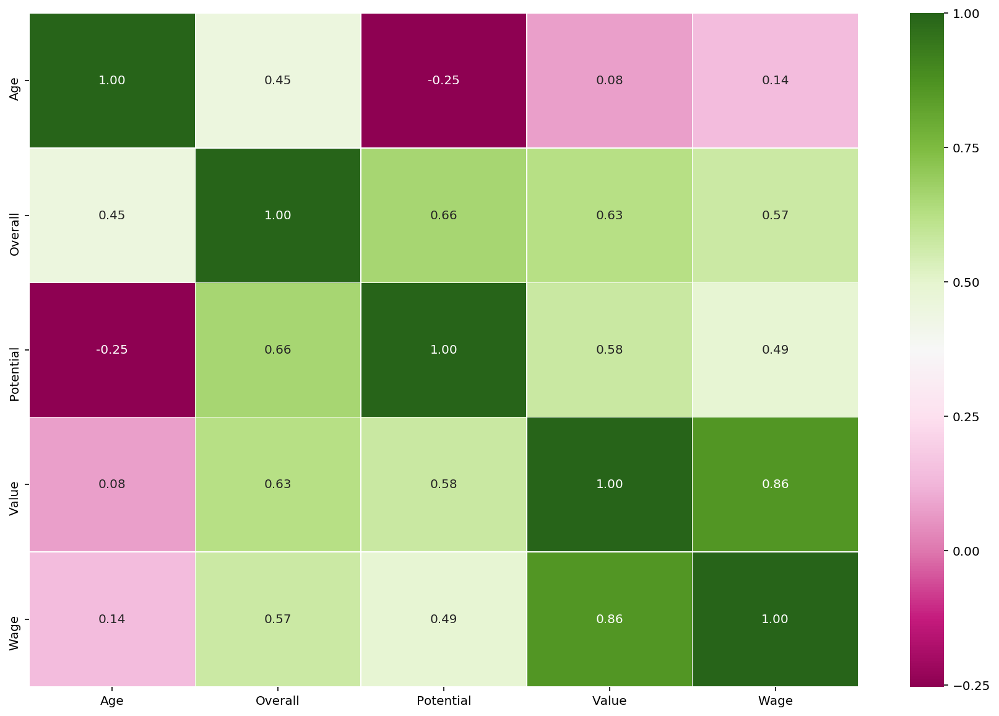

In [26]:
plt.figure(figsize=(15,10))
plot = sns.heatmap(correlation_fifa.corr(), annot=True, fmt = '.2f', linewidths=0.2, cmap='PiYG')

### 1) 나이가 많은 선수일수록(숙련된 선수일수록) 전반적 점수가 높다.
* Age와 Overall의 상관계수 : 0.45

Text(9.924999999999997, 0.5, 'Wage')

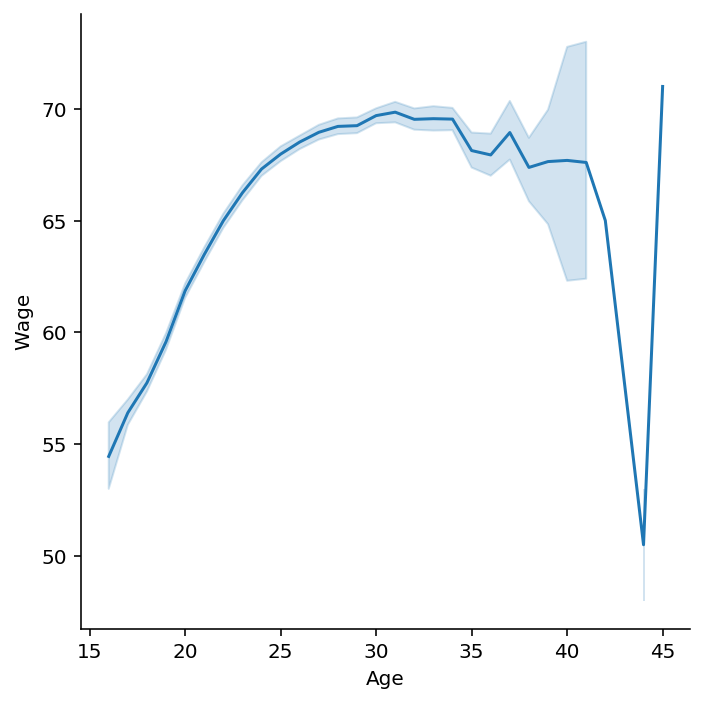

In [27]:
sns.relplot(x = "Age", y = "Overall", kind = "line", data = fifa)
plt.xlabel('Age')
plt.ylabel('Wage')

### 2) 어릴수록 가능성 점수가 높다.
* Age와 Potential의 상관계수 : -0.25

Text(9.924999999999997, 0.5, 'Wage')

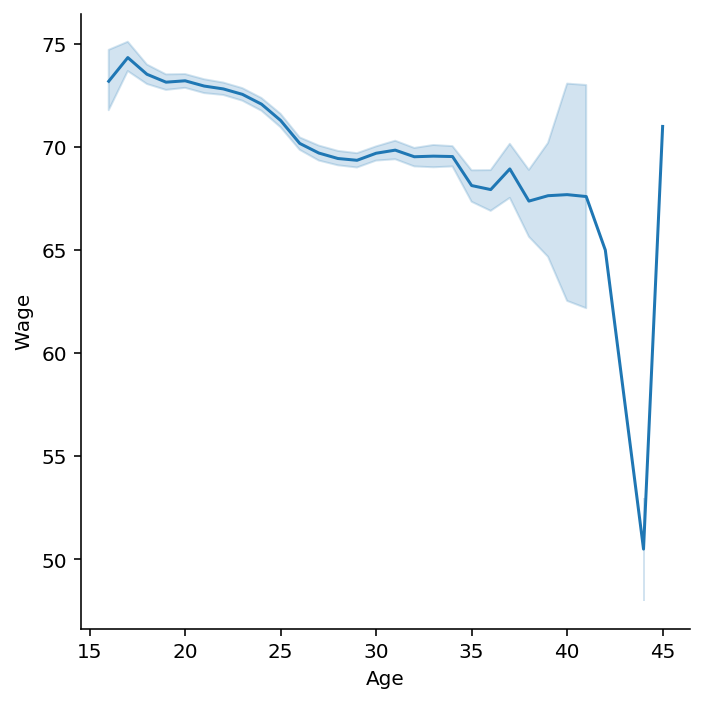

In [28]:
sns.relplot(x = "Age", y = "Potential", kind = "line", data = fifa)
plt.xlabel('Age')
plt.ylabel('Wage')

### 3) 30대 초반의 선수들이 가장 높은 주급을 받는다.
* Age와 Wage의 상관계수 : 0.14

Text(-8.950000000000003, 0.5, 'Wage')

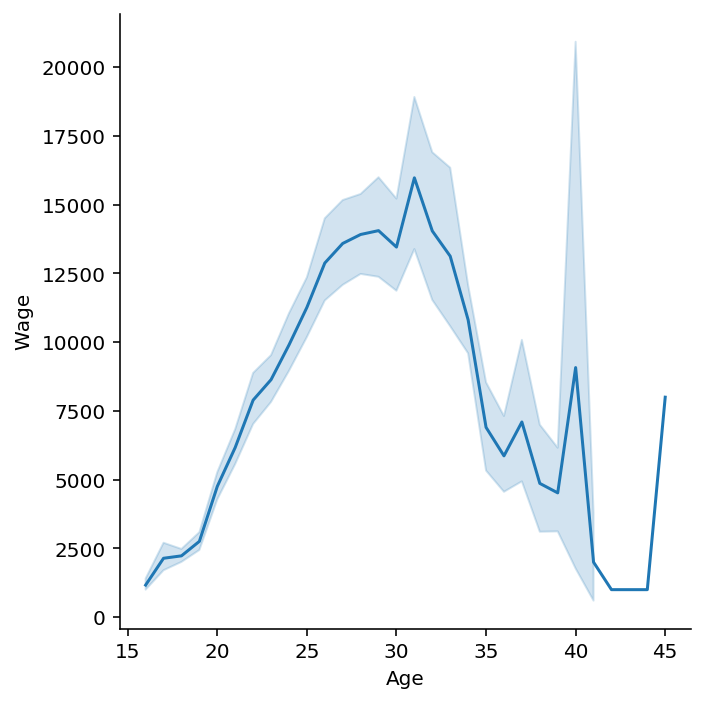

In [29]:
sns.relplot(x = "Age", y = "Wage", kind = "line", data = fifa)
plt.xlabel('Age')
plt.ylabel('Wage')

### 4) 20대 후반 선수들의 시장가치가 가장 높다.
* Age와 Value의 상관계수 : 0.08

Text(-21.325000000000003, 0.5, 'Value')

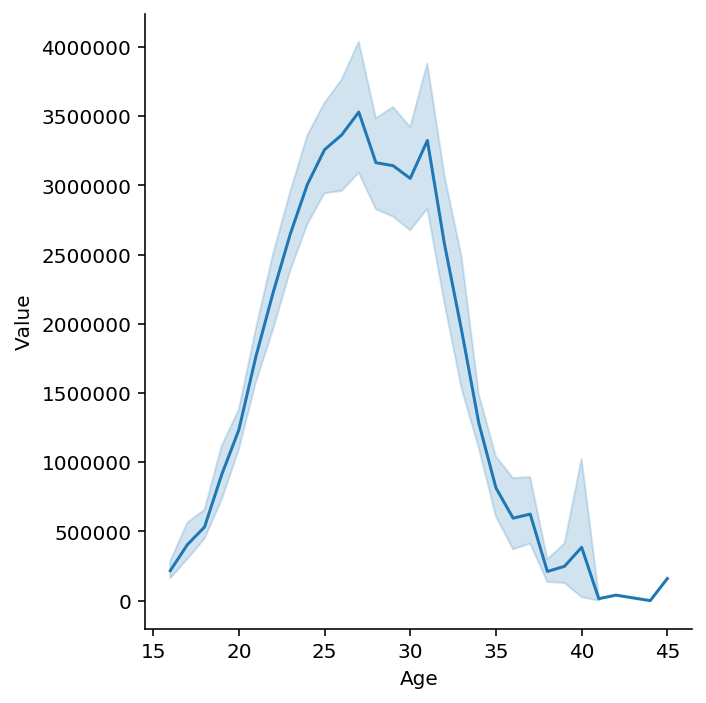

In [30]:
sns.relplot(x = "Age", y = "Value", kind = "line", data = fifa)
plt.xlabel('Age')
plt.ylabel('Value')

## 40대 선수 분석 

### 1) 40세 G. Buffon의 가치가 독보적으로 높다.

In [31]:
age_40s = fifa[fifa['Age'] >= 40][['ID', 'Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Position', 
                                 'Value', 'Wage']].sort_values(by=['Wage', 'Value'], ascending=False)
age_40s

,ID,Name,Age,Nationality,Overall,Potential,Position,Value,Wage
41,1179,G. Buffon,40,Italy,88,88,GK,4000000.000000,77000.000000
864,153260,Hilton,40,Brazil,78,78,CB,0.000000,18000.000000
4741,140029,O. Pérez,45,Mexico,71,71,GK,160000.000000,8000.000000
2821,232543,S. Bertoli,40,Argentina,73,73,GK,270000.000000,6000.000000
4228,3665,B. Nivet,41,France,71,71,CAM,0.000000,5000.000000
4187,156483,C. Lucchetti,40,Argentina,71,71,GK,160000.000000,4000.000000
3550,29552,S. Nakamura,40,Japan,72,72,CAM,0.000000,4000.000000
12192,208927,H. Sulaimani,41,Saudi Arabia,63,63,LB,0.000000,3000.000000
1294,14907,A. Bizzarri,40,Argentina,76,76,GK,525000.000000,2000.000000
7225,142998,C. Muñoz,41,Argentina,68,68,GK,60000.000000,1000.000000


### 2) 선수 수명이 가장 긴 포지션은 골키퍼다.

In [32]:
age_40s['Position'].value_counts()

GK     15
CB      2
LCB     2
CAM     2
LB      1
Name: Position, dtype: int64

### 3) 최고령자인 45세 O. Pérez는 2021년에 계약이 끝난다. (재계약이 가능할까?)

In [33]:
fifa.iloc[4741][['Name', 'Age', 'Nationality', 'Club', 'International Reputation', 'Skill Moves', 
                 'Position', 'Joined', 'Loaned From', 'Contract Valid Until']]

Name                           O. Pérez
Age                                  45
Nationality                      Mexico
Club                            Pachuca
International Reputation       2.000000
Skill Moves                    1.000000
Position                             GK
Joined                      Jun 1, 1991
Loaned From                         NaN
Contract Valid Until               2021
Name: 4741, dtype: object

## 구단별 비교

In [34]:
fifa.groupby('Club')['Overall', 'Potential', 'Wage', 'Value', 
                     'Release Clause'].mean().sort_values('Wage', ascending=False)

,Overall,Potential,Wage,Value,Release Clause
Club,,,,,
Real Madrid,78.242424,84.636364,152030.303030,26497727.272727,56293575.757576
FC Barcelona,78.030303,85.303030,146575.757576,25836363.636364,54939393.939394
Juventus,82.280000,85.520000,131680.000000,28179000.000000,47744000.000000
Manchester City,76.727273,83.909091,113363.636364,23835000.000000,45845666.666667
Manchester United,77.242424,82.666667,102757.575758,17843939.393939,34621212.121212
Chelsea,76.787879,82.636364,98454.545455,18388333.333333,33115575.757576
Liverpool,76.000000,82.393939,87939.393939,17728939.393939,35025212.121212
Tottenham Hotspur,76.696970,82.060606,79484.848485,18740909.090909,36131000.000000
FC Bayern München,77.000000,83.655172,78827.586207,23414655.172414,35707517.241379


### 1) 평균 주급 기준 상위 5개 구단은 가능성 있는 선수를 얼마나 데리고 있을까?

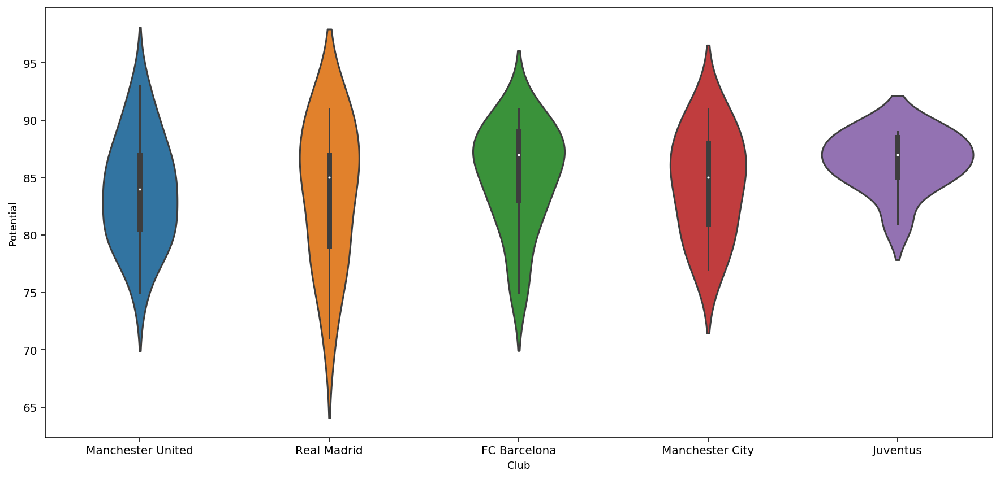

In [35]:
some_club = ('Real Madrid', 'FC Barcelona', 'Juventus', 'Manchester City', 'Manchester United')
fifa_club = fifa.loc[fifa['Club'].isin(some_club) & fifa['Potential']]

plt.rcParams['figure.figsize'] = (15, 7)
ax = sns.violinplot(x = fifa_club['Club'], y = fifa_club['Potential'], kind = 'violin')
ax.set_xlabel(xlabel = 'Club', fontsize = 9)
ax.set_ylabel(ylabel = 'Potential', fontsize = 9)
plt.show()

### 2) 평균 Release Clause 기준 상위 20개 구단
* 전처리 과정에서 Release Clause의 결측치를 0으로 채웠으므로 그 값을 제외하고 평균을 구한다.

In [36]:
rc_dropna = fifa[fifa['Release Clause']!=0]
club_rc = rc_dropna.groupby('Club')['Release Clause'].describe()
club_rc

,count,mean,std,min,25%,50%,75%,max
Club,,,,,,,,
SSV Jahn Regensburg,25.000000,1290840.000000,808465.505345,105000.000000,736000.000000,1200000.000000,1500000.000000,3700000.000000
1. FC Heidenheim 1846,28.000000,1628607.142857,1379612.917782,239000.000000,1000000.000000,1350000.000000,1925000.000000,7800000.000000
1. FC Kaiserslautern,26.000000,990846.153846,822270.013672,203000.000000,404250.000000,852500.000000,1275000.000000,4200000.000000
1. FC Köln,28.000000,7751642.857143,7906252.636781,191000.000000,1700000.000000,6400000.000000,10175000.000000,37800000.000000
1. FC Magdeburg,24.000000,1289083.333333,632745.426979,280000.000000,920250.000000,1200000.000000,1525000.000000,3000000.000000
1. FC Nürnberg,25.000000,4174720.000000,3588623.558321,650000.000000,1500000.000000,2800000.000000,6500000.000000,13100000.000000
1. FC Union Berlin,25.000000,2713880.000000,1714755.189524,223000.000000,1300000.000000,2700000.000000,4100000.000000,6100000.000000
1. FSV Mainz 05,31.000000,7828290.322581,6006976.461824,440000.000000,3150000.000000,6700000.000000,11500000.000000,27200000.000000
AC Ajaccio,22.000000,1324181.818182,1029058.637617,210000.000000,524250.000000,1200000.000000,1750000.000000,4300000.000000


In [37]:
rc_mean = club_rc['mean'].nlargest(20).reset_index().set_index('Club')
rc_mean

,mean
Club,
Real Madrid,56293575.757576
FC Barcelona,54939393.939394
Juventus,47744000.000000
Manchester City,45845666.666667
Atlético Madrid,41686333.333333
Paris Saint-Germain,40542200.000000
Napoli,37420833.333333
FC Bayern München,36982785.714286
Tottenham Hotspur,36131000.000000


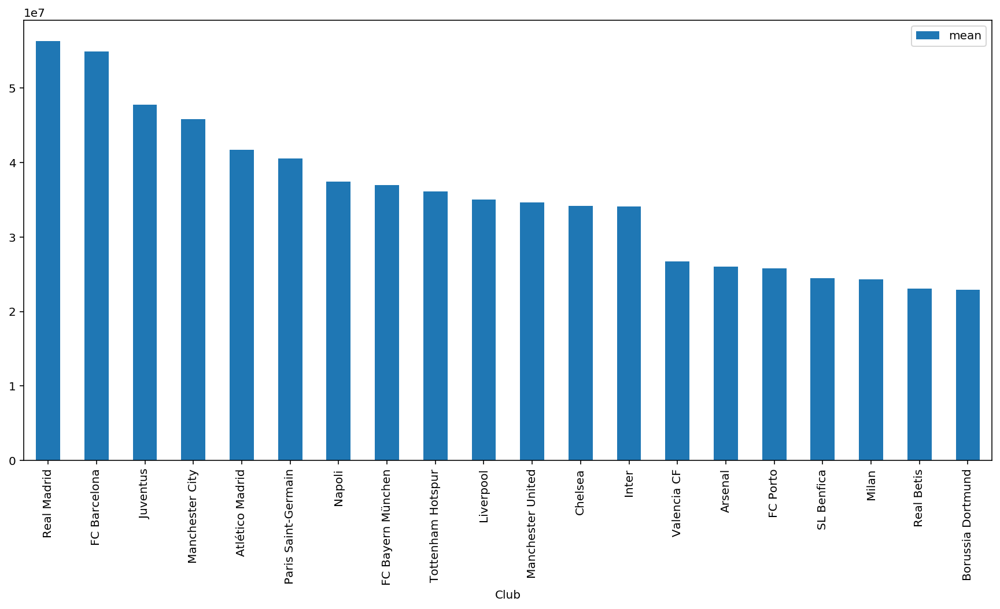

In [41]:
rc_mean.plot(kind='bar')

## 포지션별 비교

### 1) 평균 주급과 표준편차 비교

* 평균이 가장 높은 포지션: RF (Right Forward)
* 표준편차가 가장 큰 포지션: RF (Right Forward)
* 평균이 가장 작은 포지션: GK (Goalkeeper)
* 표준편차가 가장 작은 포지션: LWB (Left Wing Backs)

In [42]:
fifa.groupby('Position')['Wage'].describe().sort_values('mean', ascending=False)

,count,mean,std,min,25%,50%,75%,max
Position,,,,,,,,
RF,16.000000,52687.500000,140297.644908,2000.000000,4000.000000,11500.000000,18000.000000,565000.000000
LF,15.000000,44666.666667,96328.802003,1000.000000,3000.000000,9000.000000,20000.000000,340000.000000
LAM,21.000000,26142.857143,66644.043781,2000.000000,6000.000000,10000.000000,16000.000000,315000.000000
RAM,21.000000,19095.238095,30898.065897,1000.000000,9000.000000,12000.000000,20000.000000,150000.000000
LS,207.000000,15260.869565,26839.139027,0.000000,3000.000000,6000.000000,17000.000000,245000.000000
RW,370.000000,14432.432432,32296.006063,0.000000,2000.000000,4000.000000,12000.000000,215000.000000
RCM,391.000000,14404.092072,34726.334995,0.000000,2000.000000,4000.000000,14500.000000,420000.000000
RS,203.000000,14379.310345,34736.760645,0.000000,3000.000000,6000.000000,17000.000000,455000.000000
LCM,395.000000,14131.645570,30169.872458,0.000000,2000.000000,5000.000000,15000.000000,355000.000000


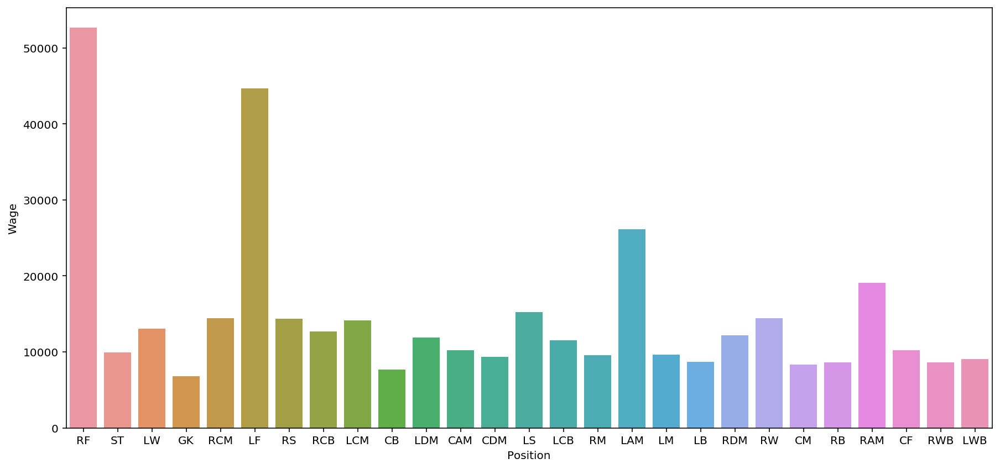

In [45]:
plot1 = sns.barplot(x="Position", y="Wage", data=fifa, ci=None)

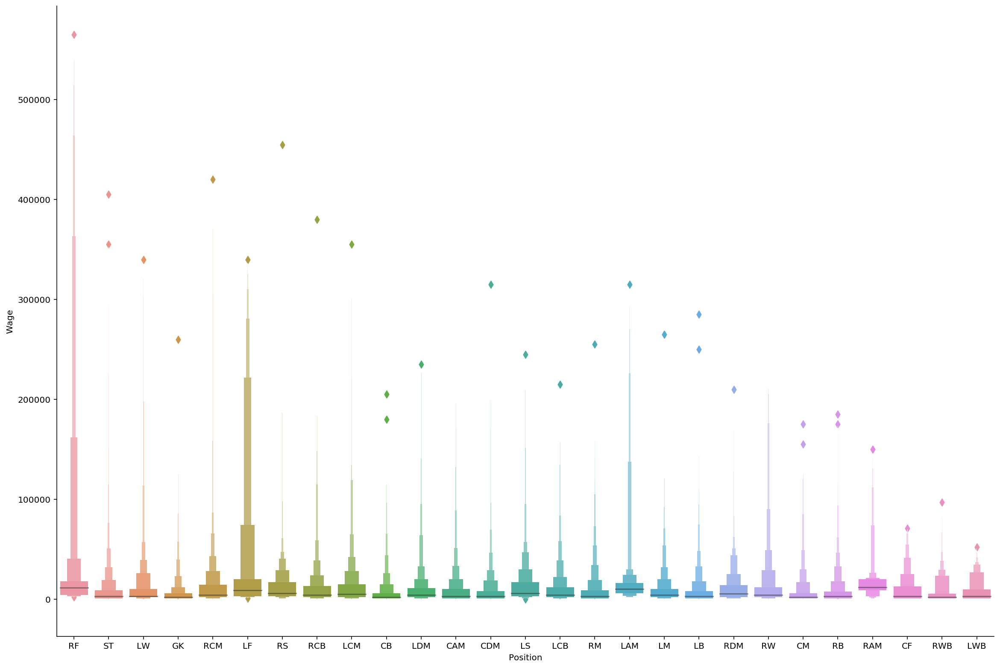

In [46]:
plot2 = sns.catplot(x='Position', y='Wage', kind='boxen', data=fifa)

### 2) 포지션별 가능성이 가장 높은 선수 

In [47]:
fifa.iloc[fifa.groupby(fifa['Position'])['Potential'].idxmax()][['Position','Potential', 'Name', 'Age', 'Club', 'Nationality']].sort_values('Potential', ascending=False)

,Position,Potential,Name,Age,Club,Nationality
25,RM,95,K. Mbappé,19,Paris Saint-Germain,France
1,ST,94,Cristiano Ronaldo,33,Juventus,Portugal
0,RF,94,L. Messi,31,FC Barcelona,Argentina
15,LF,94,P. Dybala,24,Juventus,Argentina
3,GK,93,De Gea,27,Manchester United,Spain
2,LW,93,Neymar Jr,26,Paris Saint-Germain,Brazil
42,CB,92,S. Umtiti,24,FC Barcelona,France
79,RW,92,Marco Asensio,22,Real Madrid,Spain
77,LCB,92,M. Škriniar,23,Inter,Slovakia
4,RCM,92,K. De Bruyne,27,Manchester City,Belgium


## 가성비 좋은 골키퍼 찾기

* 회귀선보다 아래에 위치하고, overall은 높은 편인 선수들이 가성비가 높다.
* Overall = 82, Wage = 23000, Potential = 93 인 선수 : G. Donnarumma

In [48]:
gk = fifa[fifa['Position']=='GK'][['ID', 'Name', 'Age', 'Nationality', 'Overall', 'Potential', 'Value', 'Wage', 
                              'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes']].sort_values(by='Wage', ascending=False)

In [49]:
px.scatter(gk, x='Overall', y='Wage', trendline='ols', color='Potential')

/Users/jaemin/anaconda3/lib/python3.7/site-packages/numpy/core/fromnumeric.py:2389: FutureWarning:

Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.



In [50]:
fifa[(fifa['Position']=='GK') & (fifa['Overall']==82) & (fifa['Wage']==23000) & (fifa['Potential']==93)]

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
229,230621,G. Donnarumma,19,https://cdn.sofifa.org/players/4/19/230621.png,Italy,https://cdn.sofifa.org/flags/27.png,82,93,Milan,https://cdn.sofifa.org/teams/2/light/47.png,29000000.000000,23000.000000,1278,Right,3.000000,3.000000,1.000000,Medium/ Medium,Normal,Yes,GK,22.000000,"Jul 1, 2015",NaN,2021,195.580000,89.811216,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,12.000000,12.000000,12.000000,34.000000,8.000000,28.000000,12.000000,14.000000,24.000000,28.000000,46.000000,54.000000,64.000000,74.000000,38.000000,24.000000,72.000000,34.000000,72.000000,18.000000,30.000000,26.000000,14.000000,50.000000,24.000000,68.000000,20.000000,14.000000,16.000000,88.000000,78.000000,72.000000,78.000000,88.000000,55100000.000000


## 만약 모든 골키퍼가 출전하지 못하는 일이 일어난다면?

### 1) 골키퍼가 아닌 선수들 중 골키퍼 능력 5항목의 점수가 높은 선수를 찾는다.

In [51]:
fifa[fifa['Position']!='GK']['GKDiving'].value_counts().sort_index(ascending=False).head()

53.000000    1
37.000000    1
32.000000    1
27.000000    1
26.000000    1
Name: GKDiving, dtype: int64

In [52]:
fifa[fifa['Position']!='GK']['GKHandling'].value_counts().sort_index(ascending=False).head()

48.000000    1
33.000000    1
32.000000    1
25.000000    1
22.000000    2
Name: GKHandling, dtype: int64

In [53]:
fifa[fifa['Position']!='GK']['GKKicking'].value_counts().sort_index(ascending=False).head()

62.000000    1
41.000000    4
38.000000    1
36.000000    1
33.000000    1
Name: GKKicking, dtype: int64

In [54]:
fifa[fifa['Position']!='GK']['GKPositioning'].value_counts().sort_index(ascending=False).head()

57.000000    1
33.000000    1
32.000000    1
30.000000    1
27.000000    1
Name: GKPositioning, dtype: int64

In [55]:
fifa[fifa['Position']!='GK']['GKReflexes'].value_counts().sort_index(ascending=False).head()

60.000000    1
37.000000    1
34.000000    1
33.000000    1
30.000000    1
Name: GKReflexes, dtype: int64

### 2) 5가지 항목에서 독보적으로 높은 점수를 가진 선수가 있어 찾아보니 포지션이 NaN 값

* 이름과 국적으로 구글링해보니 골키퍼였다.

In [56]:
fifa[(fifa['Position']!='GK') & (fifa['GKReflexes']==60.0)][['Name', 'Nationality', 'Position', 'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes']]

,Name,Nationality,Position,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
16450,S. Paul,India,NaN,53.000000,48.000000,62.000000,57.000000,60.000000


### 3) 각 항목에서 2번째로 높은 점수의 선수들을 찾는다.

In [57]:
fifa[(fifa['Position']!='GK') & ((fifa['GKReflexes']==37.0) | (fifa['GKHandling']==33.0) | (fifa['GKKicking']==41.0) | (fifa['GKPositioning']==33.0) | (fifa['GKReflexes']==37.0))]

,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause
7,176580,L. Suárez,31,https://cdn.sofifa.org/players/4/19/176580.png,Uruguay,https://cdn.sofifa.org/flags/60.png,91,91,FC Barcelona,https://cdn.sofifa.org/teams/2/light/241.png,80000000.000000,455000.000000,2346,Right,5.000000,4.000000,3.000000,High/ Medium,Normal,Yes,RS,9.000000,"Jul 11, 2014",NaN,2021,182.880000,86.182480,87+5,87+5,87+5,86+5,87+5,87+5,87+5,86+5,85+5,85+5,85+5,84+5,79+5,79+5,79+5,84+5,69+5,68+5,68+5,68+5,69+5,66+5,63+5,63+5,63+5,66+5,77.000000,93.000000,77.000000,82.000000,88.000000,87.000000,86.000000,84.000000,64.000000,90.000000,86.000000,75.000000,82.000000,92.000000,83.000000,86.000000,69.000000,90.000000,83.000000,85.000000,87.000000,41.000000,92.000000,84.000000,85.000000,85.000000,62.000000,45.000000,38.000000,27.000000,25.000000,31.000000,33.000000,37.000000,164000000.000000
1078,53914,P. Jagielka,35,https://cdn.sofifa.org/players/4/19/53914.png,England,https://cdn.sofifa.org/flags/14.png,77,77,Everton,https://cdn.sofifa.org/teams/2/light/7.png,2100000.000000,53000.000000,1835,Right,2.000000,3.000000,2.000000,Medium/ High,Normal,Yes,CB,6.000000,"Jul 4, 2007",NaN,2019,180.340000,87.089664,55+2,55+2,55+2,51+2,53+2,53+2,53+2,51+2,53+2,53+2,53+2,53+2,59+2,59+2,59+2,53+2,65+2,69+2,69+2,69+2,65+2,67+2,75+2,75+2,75+2,67+2,55.000000,30.000000,77.000000,70.000000,44.000000,49.000000,55.000000,31.000000,66.000000,60.000000,40.000000,51.000000,45.000000,72.000000,61.000000,69.000000,81.000000,50.000000,77.000000,54.000000,79.000000,77.000000,48.000000,39.000000,55.000000,76.000000,78.000000,77.000000,76.000000,32.000000,33.000000,38.000000,32.000000,34.000000,4000000.000000
6359,184512,D. Tonucci,29,https://cdn.sofifa.org/players/4/19/184512.png,Italy,https://cdn.sofifa.org/flags/27.png,69,69,Foggia,https://cdn.sofifa.org/teams/2/light/110911.png,825000.000000,2000.000000,1514,Right,1.000000,2.000000,2.000000,Low/ High,Normal,No,RCB,5.000000,"Jan 9, 2018",NaN,2020,182.880000,78.017824,45+2,45+2,45+2,40+2,41+2,41+2,41+2,40+2,40+2,40+2,40+2,42+2,46+2,46+2,46+2,42+2,56+2,60+2,60+2,60+2,56+2,58+2,68+2,68+2,68+2,58+2,33.000000,31.000000,61.000000,47.000000,32.000000,41.000000,31.000000,32.000000,44.000000,48.000000,51.000000,33.000000,34.000000,69.000000,77.000000,42.000000,82.000000,71.000000,89.000000,42.000000,74.000000,66.000000,29.000000,21.000000,42.000000,69.000000,69.000000,74.000000,64.000000,5.000000,11.000000,41.000000,7.000000,21.000000,1300000.000000
6409,184527,M. Mustacchio,29,https://cdn.sofifa.org/players/4/19/184527.png,Italy,https://cdn.sofifa.org/flags/27.png,69,69,Perugia,https://cdn.sofifa.org/teams/2/light/199.png,1000000.000000,3000.000000,1825,Right,1.000000,4.000000,3.000000,High/ Low,Normal,No,RM,9.000000,"Jan 24, 2017",NaN,2020,180.340000,78.017824,66+2,66+2,66+2,68+2,66+2,66+2,66+2,68+2,65+2,65+2,65+2,68+2,60+2,60+2,60+2,68+2,58+2,52+2,52+2,52+2,58+2,55+2,48+2,48+2,48+2,55+2,63.000000,62.000000,61.000000,66.000000,61.000000,69.000000,65.000000,57.000000,54.000000,66.000000,91.000000,90.000000,82.000000,63.000000,72.000000,66.000000,70.000000,78.000000,61.000000,61.000000,46.000000,36.000000,64.000000,56.000000,65.000000,61.000000,52.000000,28.000000,35.000000,5.000000,11.000000,41.000000,7.000000,21.000000,1600000.000000
7054,189035,N. Giani,32,https://cdn.sofifa.org/players/4/19/

## 각 세부기술 능력과 다른 요인들의 상관관계

### 1) 체격이 작을수록 세부기술 능력이 뛰어나다. 

* 키, 체중 변수와 세부기술 변수들이 대부분 음의 상관관계를 가진다.
* 골키퍼 능력은 키와의 상관계수가 0.36, 체중과의 상관계수가 0.34로 서로 양의 상관관계를 가진다.
* Strength(힘)은 체격이 클 수록 좋다. : 키와의 상관계수가 0.54, 체중과의 상관계수가 0.62 <br>


* 전처리 과정에서 Height, Weight의 결측치를 0으로 채웠으므로 그 값을 제외한 평균값으로 대체한 후 상관계수를 구했다.

In [58]:
fifa[['Height', 'Weight']].mean()

Height   180.779725
Weight    75.088323
dtype: float64

In [59]:
height_avg = sum(fifa['Height']) / (len(fifa) - len(fifa[fifa['Height']==0]))
weight_avg = sum(fifa['Weight']) / (len(fifa) - len(fifa[fifa['Weight']==0]))

In [60]:
fifa['Height'] = fifa['Height'].apply(lambda x: height_avg if x==0 else x)
fifa['Weight'] = fifa['Weight'].apply(lambda x: weight_avg if x==0 else x)

In [61]:
fifa[['Height', 'Weight']].mean()

Height   181.257584
Weight    75.286805
dtype: float64

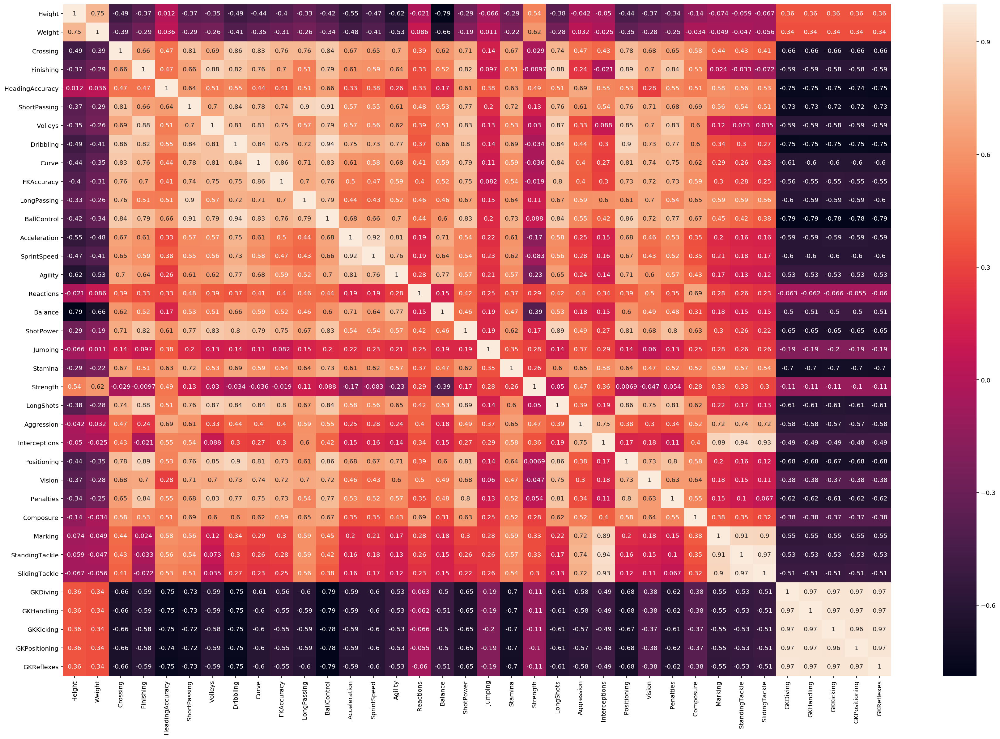

In [62]:
plt.rcParams['figure.figsize'] = (30, 20)
sns.heatmap(fifa[['Height', 'Weight', 
                  'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 
                  'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 
                  'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions', 
                  'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 
                  'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes',]].corr(), annot = True)

### 2) 반응력과 침착성은 전반적 점수를 결정하는 데에 중요한 요인으로 작용한다.

* Reactions : 반응력
* Composure : 침착성 (어려운 상황에서도 슛을 정확히 차는 정도)

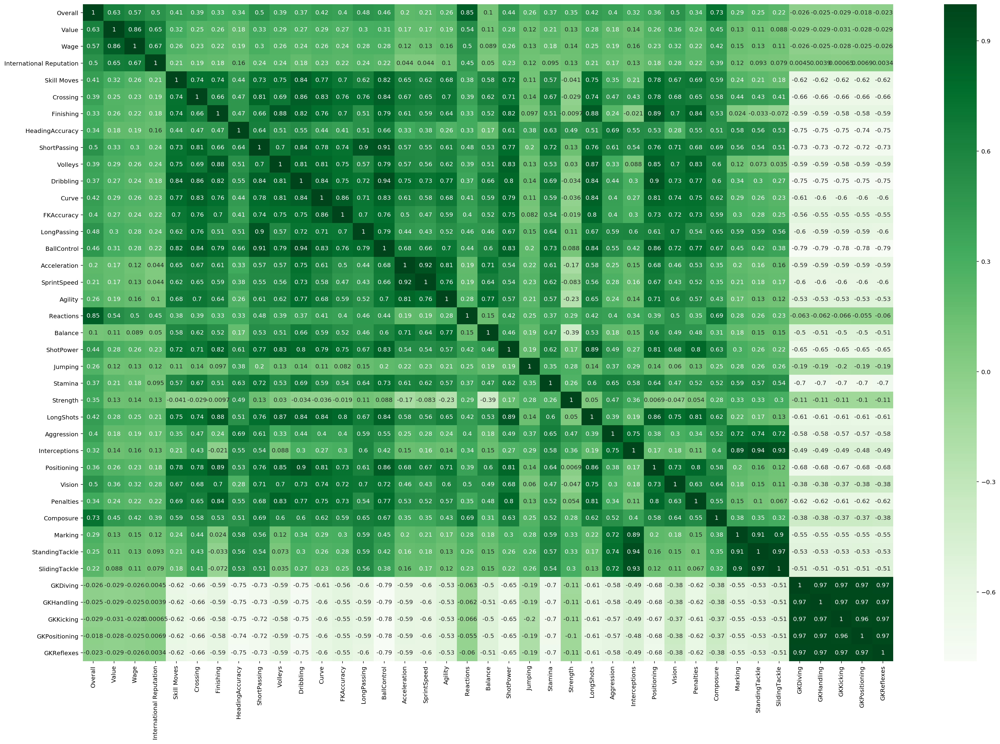

In [63]:
plt.rcParams['figure.figsize'] = (30, 20)
sns.heatmap(fifa[['Overall', 'Value', 'Wage', 'International Reputation', 'Skill Moves', 
                  'Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing', 'Volleys', 'Dribbling', 'Curve', 
                  'FKAccuracy', 'LongPassing', 'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions', 
                  'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots', 'Aggression', 'Interceptions', 
                  'Positioning', 'Vision', 'Penalties', 'Composure', 'Marking', 'StandingTackle', 'SlidingTackle', 
                  'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes',]].corr(), annot = True, cmap="Greens")

In [64]:
from statsmodels.formula.api import ols

In [65]:
res = ols('Overall ~ Reactions', fifa).fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Overall   R-squared:                       0.723
Model:                            OLS   Adj. R-squared:                  0.723
Method:                 Least Squares   F-statistic:                 4.729e+04
Date:                Sun, 20 Oct 2019   Prob (F-statistic):               0.00
Time:                        20:19:35   Log-Likelihood:                -49237.
No. Observations:               18159   AIC:                         9.848e+04
Df Residuals:                   18157   BIC:                         9.849e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     25.9125      0.187    138.239      0.000      25.545      26.280
Reactions      0.6523      0.003    217.466      0.000       0.646       0.658
==============================================================================
Omnibus:                      180.259   Durbin-Watson:                   1.449
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              214.815
Skew:                          -0.182   Prob(JB):                     2.26e-47
Kurtosis:                       3.390   Cond. No.                         434.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* 회귀식 : overall = 0.6523 * reactions + 25.9125
* 회귀계수가 95% 신뢰구간 내에 있다.
* overall을 결정하는 것의 72.3%는 반응력으로 설명이 된다.

<Figure size 1080x720 with 0 Axes>

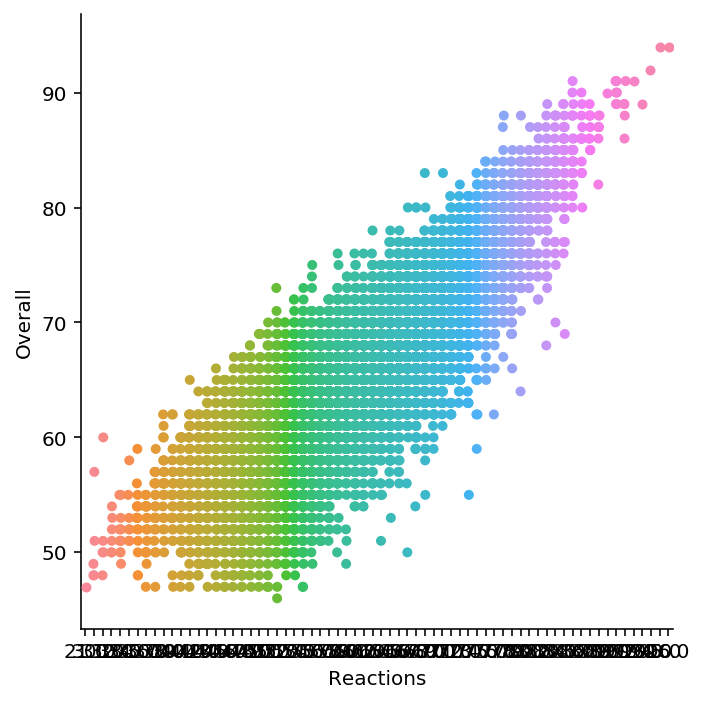

In [66]:
plt.figure(figsize=(15,10))
sns.catplot(x = 'Reactions', y = 'Overall', data = fifa)

In [67]:
res = ols('Overall ~ Composure', fifa).fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Overall   R-squared:                       0.529
Model:                            OLS   Adj. R-squared:                  0.529
Method:                 Least Squares   F-statistic:                 2.043e+04
Date:                Sun, 20 Oct 2019   Prob (F-statistic):               0.00
Time:                        20:19:52   Log-Likelihood:                -54034.
No. Observations:               18159   AIC:                         1.081e+05
Df Residuals:                   18157   BIC:                         1.081e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     40.4469      0.184    219.924      0.000      40.086      40.807
Composure      0.4400      0.003    142.942      0.000       0.434       0.446
==============================================================================
Omnibus:                     1168.834   Durbin-Watson:                   1.060
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2404.826
Skew:                           0.444   Prob(JB):                         0.00
Kurtosis:                       4.546   Cond. No.                         312.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* 회귀식 : overall = 0.4400 * composure + 40.4469
* 회귀계수가 95% 신뢰구간 내에 있다.
* overall을 결정하는 것의 52.9%는 침착성으로 설명이 된다.

<Figure size 1080x720 with 0 Axes>

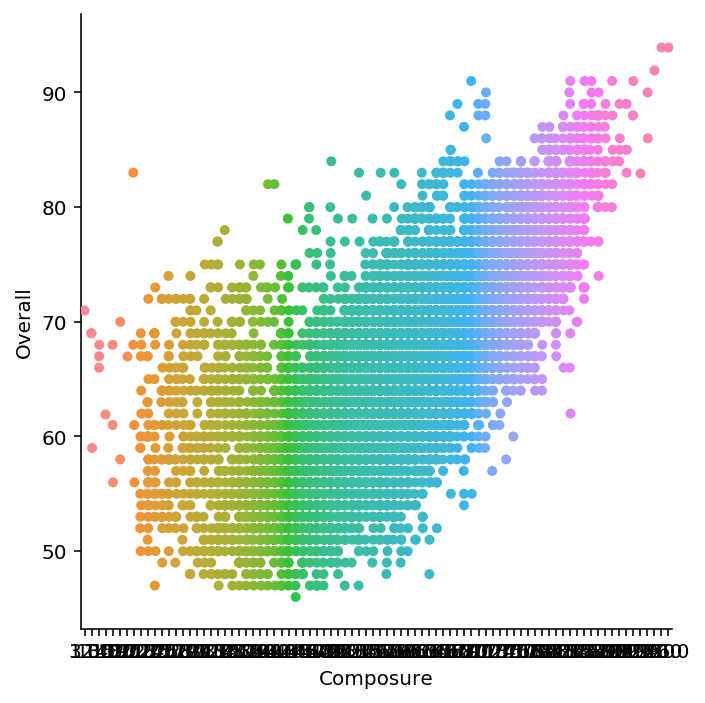

In [68]:
plt.figure(figsize=(15,10))
sns.catplot(x = 'Composure', y = 'Overall', data = fifa)

In [69]:
res = ols('Overall ~ Reactions + Composure', fifa).fit()
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                Overall   R-squared:                       0.762
Model:                            OLS   Adj. R-squared:                  0.762
Method:                 Least Squares   F-statistic:                 2.910e+04
Date:                Sun, 20 Oct 2019   Prob (F-statistic):               0.00
Time:                        20:19:59   Log-Likelihood:                -47838.
No. Observations:               18159   AIC:                         9.568e+04
Df Residuals:                   18156   BIC:                         9.571e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     25.1119      0.174    144.186      0.000      24.770      25.453
Reactions      0.5085      0.004    133.291      0.000       0.501       0.516
Composure      0.1653      0.003     54.995      0.000       0.159       0.171
==============================================================================
Omnibus:                      101.523   Durbin-Watson:                   1.528
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              143.191
Skew:                          -0.049   Prob(JB):                     8.06e-32
Kurtosis:                       3.424   Cond. No.                         600.
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

* 변수가 reactions 일 때 Adj. R-squared : 0.723
* 변수가 composure 일 때 Adj. R-squared : 0.529
* 변수가 reactions, composure 일 때 Adj. R-squared : 0.762
* 두 변수를 넣었을 때의 Cond. No.가 하나씩 넣었을 때보다 지나치게 큰 경우가 아니므로, 다중공선성이 존재하지 않는다. -> 두 변수를 같이 보는 것이 더 좋은 모델이다.

## 선수 국적별 분석

### 1) 국가별 선수 수

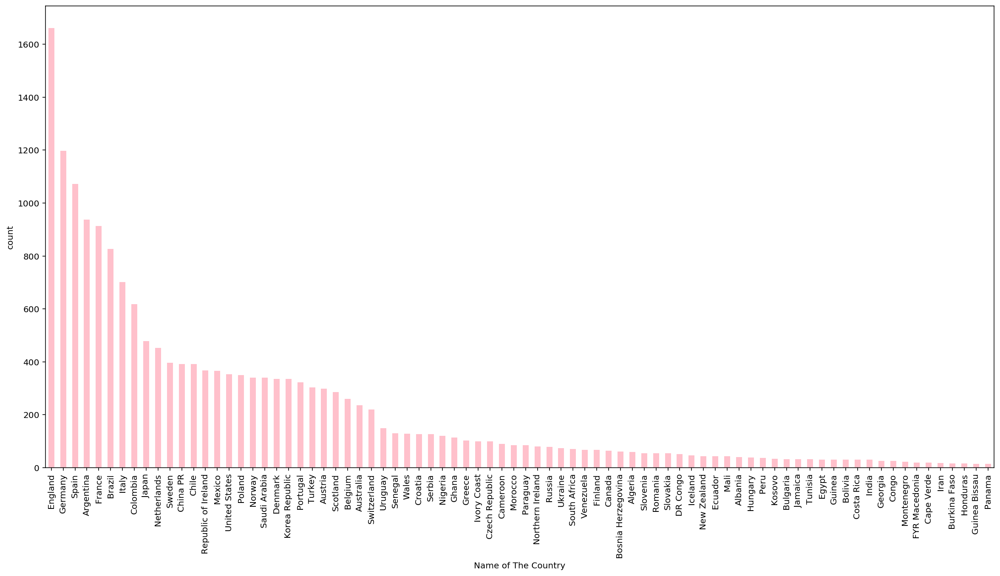

In [71]:
plt.style.use
fifa['Nationality'].value_counts().head(80).plot.bar(color = 'pink',figsize = (20, 10))
plt.xlabel('Name of The Country')
plt.ylabel('count')
plt.show()

### 2) 국적별 평균 Overall을 지도로 보기

In [72]:
nationality = fifa.groupby(['Nationality'])['Nationality', 'Overall', 'Wage', 'Value'].mean().reset_index()

In [73]:
import geopy
from geopy.geocoders import Nominatim

In [74]:
geolocator = Nominatim(timeout = None)
def get_lat(country_name):
    location = geolocator.geocode(country_name)
    if location is None:
        return None
    else:
        return location.latitude

def get_long(country_name):
    location = geolocator.geocode(country_name)
    if location is None:
        return None
    else:
        return location.longitude

/Users/jaemin/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning:

Using Nominatim with the default "geopy/1.20.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.



In [104]:
nationality['lat'] = nationality['Nationality'].apply(get_lat)

In [105]:
nationality['long'] = nationality['Nationality'].apply(get_long)

In [106]:
nationality.head(100)

,Nationality,Overall,Wage,Value,lat,long
0,Afghanistan,61.000000,1250.000000,3.425000e+05,33.768006,66.238514
1,Albania,65.925000,7100.000000,1.920250e+06,41.000028,19.999962
2,Algeria,70.633333,18083.333333,4.670917e+06,28.000027,2.999983
3,Andorra,62.000000,1000.000000,2.900000e+05,42.540717,1.573203
4,Angola,67.600000,7666.666667,2.018333e+06,-11.877577,17.569124
5,Antigua & Barbuda,62.500000,2500.000000,5.350000e+05,17.079128,-61.822252
6,Argentina,68.572038,11502.668090,3.077012e+06,-34.996496,-64.967282
7,Armenia,69.000000,22000.000000,3.717500e+06,40.769627,44.673665
8,Australia,62.652542,3351.694915,7.369703e+05,-24.776109,134.755000
9,Austria,64.916107,7667.785235,1.608658e+06,47.200034,13.199959


In [108]:
nationality[np.isnan(nationality['lat'])]

,Nationality,Overall,Wage,Value,lat,long
27,Central African Rep.,73.333333,19000.0,10050000.0,NaN,NaN
51,FYR Macedonia,68.000000,7900.0,2778750.0,NaN,NaN
85,Korea DPR,65.500000,4250.0,950000.0,NaN,NaN


In [109]:
nationality.loc[27,'lat'] = get_lat("Central African Republic")
nationality.loc[27,'long'] = get_long("Central African Republic")
nationality.loc[51,'lat'] = get_lat("North Macedonia")
nationality.loc[51,'long'] = get_long("North Macedonia")
nationality.loc[85,'lat'] = get_lat("North Korea")
nationality.loc[85,'long'] = get_long("North Korea")

In [110]:
nationality[np.isnan(nationality['lat'])]

,Nationality,Overall,Wage,Value,lat,long


In [111]:
jet = plt.cm.get_cmap('jet')

In [112]:
lat = []
long = []
overall = []

lat = nationality[['lat']].to_numpy()
long = nationality[['long']].to_numpy()
overall = nationality[['Overall']].to_numpy()

In [113]:
nationality['Overall'].max()

77.0

In [114]:
nationality['Overall'].min()

56.0

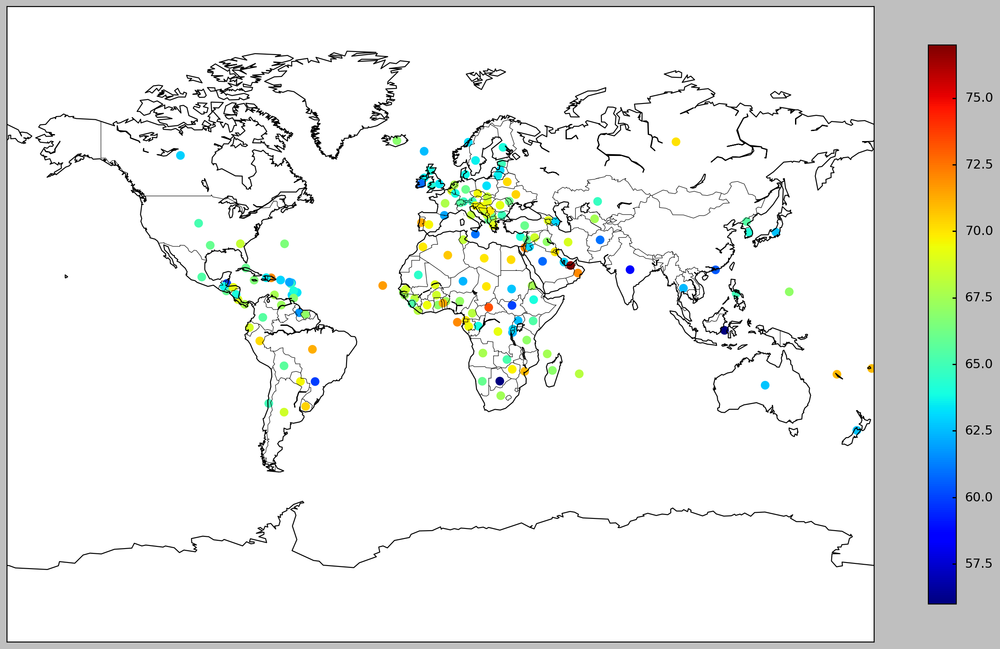

In [115]:
from mpl_toolkits.basemap import Basemap
from matplotlib import style

style.use('seaborn-talk')
plt.figure(figsize=(20,20))
basemap = Basemap(projection = 'mill')
basemap.drawcoastlines()
basemap.drawcountries()
x,y = basemap(long, lat)
sc = plt.scatter(x,y, c=overall, vmin=56, vmax =77, cmap=jet, s=80, edgecolors='none')
cbar = plt.colorbar(sc, shrink = .5)
plt.show()

다른 형태의 지도로 표현

In [117]:
nationality2 = nationality

In [118]:
nationality2 = nationality2.drop(['lat', 'long'], axis=1)

In [119]:
from geonamescache import GeonamesCache

gc = GeonamesCache()
iso3_codes = list(gc.get_dataset_by_key(gc.get_countries(), 'iso3').keys())

In [120]:
import pycountry

input_countries = nationality2['Nationality']

countries = {}
for country in pycountry.countries:
    countries[country.name] = country.alpha_3

codes = [countries.get(country, 'Unknown code') for country in input_countries]

nationality2['Country Code'] = codes

In [121]:
nationality2[nationality2['Country Code'] == 'Unknown code']

,Nationality,Overall,Wage,Value,Country Code
5,Antigua & Barbuda,62.500000,2500.000000,5.350000e+05,Unknown code
17,Bolivia,65.666667,833.333333,2.990000e+05,Unknown code
18,Bosnia Herzegovina,68.639344,14868.852459,3.682377e+06,Unknown code
26,Cape Verde,71.631579,11526.315789,4.426579e+06,Unknown code
27,Central African Rep.,73.333333,19000.000000,1.005000e+07,Unknown code
30,China PR,59.910714,3125.000000,3.554209e+05,Unknown code
37,Curacao,67.571429,8857.142857,1.648571e+06,Unknown code
39,Czech Republic,69.510000,7950.000000,2.837200e+06,Unknown code
40,DR Congo,69.211538,13769.230769,3.160481e+06,Unknown code
46,England,63.429603,9943.441637,1.498745e+06,Unknown code


In [122]:
nationality2.loc[5, 'Country Code'] = "ATG"
nationality2.loc[17, 'Country Code'] = "BOL"
nationality2.loc[18, 'Country Code'] = "BIH"
nationality2.loc[26, 'Country Code'] = "CPV"
nationality2.loc[27, 'Country Code'] = "CAF"
nationality2.loc[30, 'Country Code'] = "CHN"
nationality2.loc[37, 'Country Code'] = "CUW"
nationality2.loc[39, 'Country Code'] = "CZE"
nationality2.loc[40, 'Country Code'] = "COD"
nationality2.loc[46, 'Country Code'] = "GBR"
nationality2.loc[51, 'Country Code'] = "MKD"
nationality2.loc[66, 'Country Code'] = "GNB"
nationality2.loc[75, 'Country Code'] = "IRN"
nationality2.loc[79, 'Country Code'] = "CIV"
nationality2.loc[85, 'Country Code'] = "PRK"
nationality2.loc[86, 'Country Code'] = "KOR"
nationality2.loc[87, 'Country Code'] = "RKS"
nationality2.loc[102, 'Country Code'] = "MDA"
nationality2.loc[114, 'Country Code'] = "GBR"
nationality2.loc[117, 'Country Code'] = "PSE"
nationality2.loc[126, 'Country Code'] = "IRL"
nationality2.loc[128, 'Country Code'] = "RUS"
nationality2.loc[131, 'Country Code'] = "GBR"
nationality2.loc[140, 'Country Code'] = "KNA"
nationality2.loc[141, 'Country Code'] = "LCA"
nationality2.loc[146, 'Country Code'] = "SYR"
nationality2.loc[147, 'Country Code'] = "STP"
nationality2.loc[148, 'Country Code'] = "TZA"
nationality2.loc[151, 'Country Code'] = "TTO"
nationality2.loc[160, 'Country Code'] = "VEN"
nationality2.loc[161, 'Country Code'] = "GBR"

In [123]:
nationality2[nationality2['Country Code'] == 'Unknown code']

,Nationality,Overall,Wage,Value,Country Code


In [124]:
nationality2 = nationality2.drop(['Nationality'], axis =1)

In [128]:
nationality2 = nationality2.groupby(['Country Code'])['Overall', 'Wage', 'Value', 'Country Code'].mean()

In [129]:
nationality2.sort_values(by=['Overall'], ascending=False)

,Overall,Wage,Value
Country Code,,,
ARE,77.000000,39000.000000,1.050000e+07
CAF,73.333333,19000.000000,1.005000e+07
ISR,72.142857,15857.142857,4.191071e+06
OMN,72.000000,12000.000000,4.250000e+05
DOM,72.000000,71000.000000,1.040000e+07
STP,72.000000,15000.000000,2.800000e+06
CPV,71.631579,11526.315789,4.426579e+06
PRT,71.344720,14310.559006,5.063665e+06
TGO,71.333333,16000.000000,3.770833e+06


c:\python37\lib\site-packages\ipykernel_launcher.py:31: FutureWarning:


.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#ix-indexer-is-deprecated



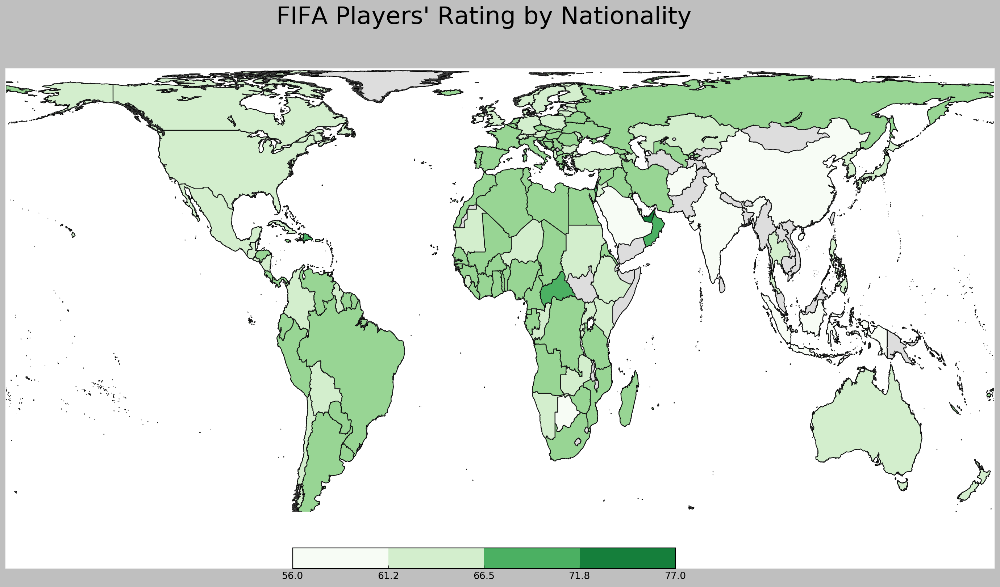

In [130]:
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import matplotlib as mpl

values = nationality2['Overall']
num_colors = 5
cm = plt.get_cmap('Greens')
scheme = [cm(i / num_colors) for i in range(num_colors)]
bins = numpy.linspace(values.min(), values.max(), num_colors)
nationality2['bin'] = numpy.digitize(values, bins) - 1
nationality2.sort_values('bin', ascending=False).head(100)

mpl.style.use('classic')
fig = plt.figure(figsize=(22, 12))
ax = fig.add_subplot(111, frame_on=False)
fig.suptitle('FIFA Players\' Rating by Nationality', fontsize=30, y=.95)

#m = Basemap(lon_0=0, projection='robin')
m =Basemap(projection='cea', lat_ts=37.5)
m.drawmapboundary(color='w')


shapefile = 'ne_10m_admin_0_countries_lakes/ne_10m_admin_0_countries_lakes'
m.readshapefile(shapefile, 'units', color='#444444', linewidth=.2)

for info, shape in zip(m.units_info, m.units):
    iso3 = info['ADM0_A3']
    if iso3 not in nationality2.index:
        color = '#dddddd'
    else:
        color = scheme[int(nationality2.ix[iso3]['bin'])]

    patches = [Polygon(numpy.array(shape), True)]
    pc = PatchCollection(patches)
    pc.set_facecolor(color)
    ax.add_collection(pc)
                      

ax.axhspan(0, 1000 * 1800, facecolor='w', edgecolor='w', zorder=2)

ax_legend = fig.add_axes([0.35, 0.14, 0.3, 0.03], zorder=3)
cmap = mpl.colors.ListedColormap(scheme)
cb = mpl.colorbar.ColorbarBase(ax_legend, cmap=cmap, ticks=bins, boundaries=bins, orientation='horizontal')
cb.ax.set_xticklabels([str(round(i, 1)) for i in bins])

plt.show()